# Aplicación de la segmentación de colores a una radiografía

Para el primer apartado de esta práctica usaremos la siguiente radiografía.

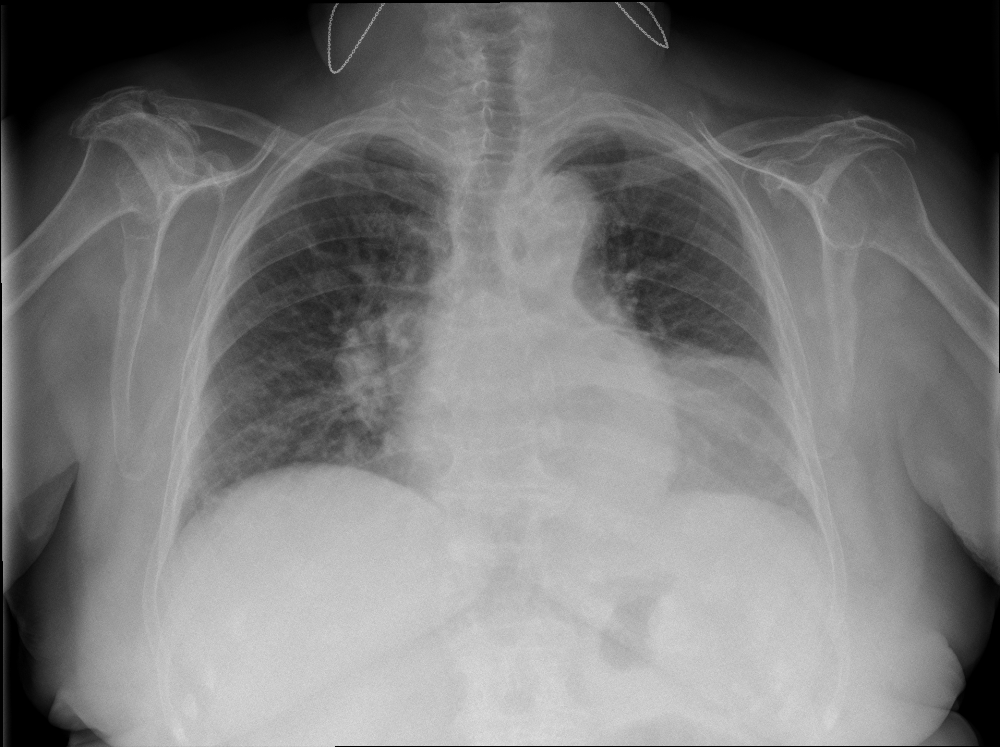

Que se ha conseguido en:
https://bimcv.cipf.es/bimcv-projects/padchest/![119688533980562249677219589534851011987_60uvre.png]

In [1]:
#Importamos las librerías
import sys
import sklearn
import numpy as np
import pandas as pd
import os
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)
from sklearn.neural_network import MLPClassifier
from sklearn.cluster import DBSCAN


In [3]:
from matplotlib.image import imread
image = imread(os.path.join("image.png"))

Las dimensiones de la imagen son:  (2181, 2917)


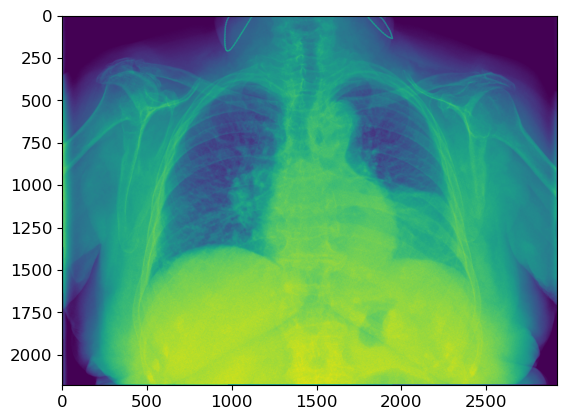

In [6]:
from matplotlib.pyplot import imshow
imshow(image);
print("Las dimensiones de la imagen son: ",image.shape)

A diferencia de la práctica de clase nuestra imagen no tiene un tercer canal con 3 componentes ya que está en escala de grises. Por eso podría tener sentido hacer un reshape(-1,1), pero eso nos dejaría un array con 6361977 componentes. Como los divisores de 6361977 son 1, 3, 727 y 2917 para mejorar un poco el proceso, a costa de perder algo en la calidad de imagen, realizaremos un clustering agrupando los pixeles de 3 en 3, que es el menor divisor distinto de 1. 

In [48]:
radiografia =  image.reshape(-1, 3)
radiografia


array([[0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.],
       ...,
       [0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.]], dtype=float32)

Hagamos un primer intento con k=10, como en el ejemplo de la práctica.

In [49]:
kmeans_radiografia = KMeans(n_clusters=10, random_state=42).fit(radiografia)

In [50]:
segmented_img = kmeans_radiografia.cluster_centers_[kmeans_radiografia.labels_]
segmented_img = segmented_img.reshape(image.shape)

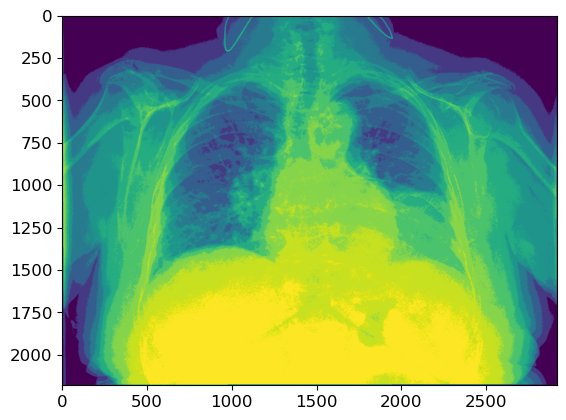

In [51]:
imshow(segmented_img);

Debido a que la fotografía original era una radiografía posiblemente hacer el método de las k medias con k = 2 sea poco útil, así que probaremos ahora con k=4, 8 y 16

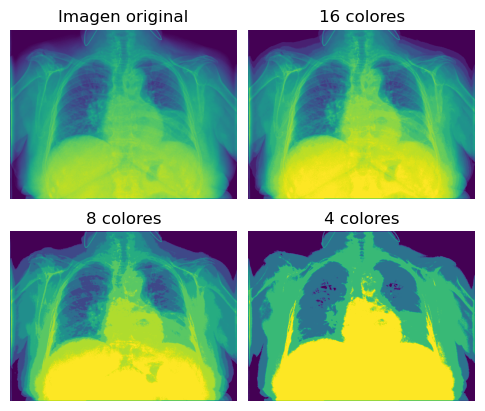

In [52]:
segmented_imgs = []
n_colors = (16,8,4)
for n_clusters in n_colors:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42).fit(radiografia)
    segmented_img = kmeans.cluster_centers_[kmeans.labels_]
    segmented_imgs.append(segmented_img.reshape(image.shape))
    
plt.figure(figsize=(6,5))
plt.subplots_adjust(wspace=0.05, hspace=0.1)

plt.subplot(221)
plt.imshow(image)
plt.title("Imagen original")
plt.axis('off')

for idx, n_clusters in enumerate(n_colors):
    plt.subplot(222 + idx)
    plt.imshow(segmented_imgs[idx])
    plt.title("{} colores".format(n_clusters))
    plt.axis('off')
plt.show()   

Y, por ejemplo, en la imagen con 16 clusters podemos observar una clara diferente entre el material óseo (en un color verdoso) y los tejidos de los órganos (en un color más amarillento). Podemos concluir que la segmentación por colores puede ayudar en el diagnóstico médico resaltando áreas en las que, por densidad del material, podría ser más complicado distinguir tejido sano.

# Estudio de mejora de una red neuronal

Comencemos generando los datos.

In [3]:
from sklearn.datasets import make_moons
from sklearn.model_selection import train_test_split

In [29]:
X_moons, y_moons = make_moons(n_samples=10000, noise=0, random_state=3)

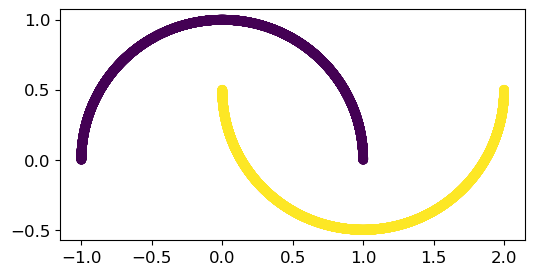

In [30]:
mpl.rcParams['figure.figsize'] = (6,3)
plt.scatter(X_moons[:,0],X_moons[:,1],c=y_moons)
plt.show()

Entrenemos ahora una red neuronal, debido a la extrema simplicidad de los datos, ya que no hay ruido, usaremos una red de una única capa con una única neurona, ya que el conjunto no es separable mediante una única recta recta y la neurona no podrá clasificarlo bien.

In [65]:
X_moons_train, X_moons_test, y_moons_train, y_moons_test = train_test_split(X_moons, y_moons, stratify=y_moons,
                                                    random_state=42,test_size=0.1)

In [32]:
mlp = MLPClassifier(solver='lbfgs', random_state=0,max_iter=1000,hidden_layer_sizes=(1,))
mlp.fit(X_moons_train, y_moons_train)

MLPClassifier(hidden_layer_sizes=(1,), max_iter=1000, random_state=0,
              solver='lbfgs')

In [33]:
print("Rendimiento en el conjunto de entrenamiento: ",mlp.score(X_moons_train,y_moons_train))
print("Rendimiento en el conjunto de prueba: ",mlp.score(X_moons_test,y_moons_test))
print("Rendimiento en el conjunto total: ",mlp.score(X_moons,y_moons))

Rendimiento en el conjunto de entrenamiento:  0.8933333333333333
Rendimiento en el conjunto de prueba:  0.898
Rendimiento en el conjunto total:  0.8938


Debido a la forma del conjunto haremos el clustering mediante DBSCAN.

In [34]:
dbscan = DBSCAN(eps=0.05, min_samples=5)
dbscan.fit(X_moons)

DBSCAN(eps=0.05)

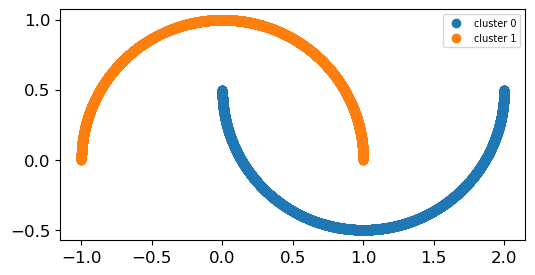

In [17]:
for i in range(max(dbscan.labels_)+1):
        plt.scatter(X_moons[dbscan.labels_==i,0], X_moons[dbscan.labels_==i,1],label='cluster ' + str(i))
plt.legend(fontsize=7)

plt.show()

In [49]:
clusters = dbscan.labels_
clusters

array([0, 0, 1, ..., 0, 1, 0], dtype=int64)

In [46]:
X_moons.shape

(10000, 2)

In [48]:
# Cambiamos las dimensiones del array clusters para que tenga la misma forma que array2 en el eje de concatenación
clusters = clusters[:, np.newaxis]

# Concatenar los dos arrays a lo largo del segundo eje (eje=1)
resultado = np.concatenate((clusters, X_moons), axis=1)
resultado

array([[ 0.        ,  0.14774589, -0.02312803],
       [ 0.        ,  0.44067975, -0.32895166],
       [ 1.        ,  0.61375583,  0.7894959 ],
       ...,
       [ 0.        ,  1.99613206,  0.41213128],
       [ 1.        ,  0.48816196,  0.87275306],
       [ 0.        ,  0.18884592, -0.08483251]])

Estos serían los nuevos datos.

In [71]:
tabla = pd.DataFrame(resultado, columns=['Cluster', 'Eje X', 'Eje y'])
tabla

,Cluster,Eje X,Eje y
0,0.0,0.147746,-0.023128
1,0.0,0.440680,-0.328952
2,1.0,0.613756,0.789496
3,1.0,-0.509944,0.860207
4,1.0,0.989481,0.144661
...,...,...,...
9995,0.0,0.362712,-0.270625
9996,0.0,1.864187,-0.003171
9997,0.0,1.996132,0.412131
9998,1.0,0.488162,0.872753


In [72]:
X_train,X_test,y_train,y_test= train_test_split(tabla, y_moons, stratify=y_moons,
                                                    random_state=42,test_size=0.1)

In [73]:
mlp = MLPClassifier(solver='lbfgs', random_state=0,max_iter=1000,hidden_layer_sizes=(1,))
mlp.fit(X_train, y_train)

MLPClassifier(hidden_layer_sizes=(1,), max_iter=1000, random_state=0,
              solver='lbfgs')

In [74]:
print("Rendimiento en el conjunto de entrenamiento: ",mlp.score(X_train,y_train))
print("Rendimiento en el conjunto de prueba: ",mlp.score(X_test,y_test))
print("Rendimiento en el conjunto total: ",mlp.score(tabla,y_moons))

Rendimiento en el conjunto de entrenamiento:  1.0
Rendimiento en el conjunto de prueba:  1.0
Rendimiento en el conjunto total:  1.0


Se comprueba que el rendimiento ha mejorado.

# Aprendizaje Semi-Supervisado

Para esta práctica utilizaremos la base de datos de supervivencia de los pacientes del doctor Haberman. Esta base de datos se encuentra en https://archive.ics.uci.edu/dataset/43/haberman+s+survival.

Aunque tengamos la base de datos completa, supondremos que solo tenemos el valor de clasificación de 45 de ellos. Realizaremos un proceso de clustering y así obtendremos otros 46 valores etiquetados y observaremos como mejora el rendimiento.

In [105]:
nombre_archivo_data = 'haberman.data'


data = pd.read_csv(nombre_archivo_data)

data =pd.DataFrame(np.array(data), columns=['Edad', 'Año operación', 'Número de nodos afectados','Supervivencia mayor a 5 años'])
data

,Edad,Año operación,Número de nodos afectados,Supervivencia mayor a 5 años
0,30,62,3,1
1,30,65,0,1
2,31,59,2,1
3,31,65,4,1
4,33,58,10,1
...,...,...,...,...
300,75,62,1,1
301,76,67,0,1
302,77,65,3,1
303,78,65,1,2


In [108]:
X_train,X_test,y_train,y_test= train_test_split(data.iloc[:,:-1],data.iloc[:,-1:], stratify=data.iloc[:,-1:],
                                                    random_state=42,test_size=0.70)
X_train
y_train

,Supervivencia mayor a 5 años
251,1
249,1
256,1
263,1
300,1
...,...
151,1
117,1
150,1
134,1


Y ahora supongamos que de estos 91 elementos de entrenamiento, solo sabemos el valor de clasificación de 45 de ellos.

In [111]:
mlp = MLPClassifier(solver='lbfgs', random_state=0,max_iter=1000)
mlp.fit(X_train[:45], y_train[:45])

C:\Users\G\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1109: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


MLPClassifier(max_iter=1000, random_state=0, solver='lbfgs')

In [112]:
print("Rendimiento en el conjunto de entrenamiento: ",mlp.score(X_train,y_train))
print("Rendimiento en el conjunto de prueba: ",mlp.score(X_test,y_test))
print("Rendimiento en el conjunto total: ",mlp.score(data.iloc[:,:-1],data.iloc[:,-1:]))

Rendimiento en el conjunto de entrenamiento:  0.8021978021978022
Rendimiento en el conjunto de prueba:  0.602803738317757
Rendimiento en el conjunto total:  0.6622950819672131


Al haber entrenado la red con tan pocos valores no hemos conseguido un buen rendimiento. Comencemos con el clustering.

In [113]:
k=45
kmeans = KMeans(n_clusters=k, random_state=42)
X_digits_dist = kmeans.fit_transform(X_train)             
representative_idx = np.argmin(X_digits_dist, axis=0) 
X_representative =np.array(X_train)[representative_digit_idx] 

Calcularemos ahora la imagenes de estos representantes de su clase 

In [114]:
y_representative = np.array(y_train)[representative_idx]

Finalmente, para los valores faltantes, veremos cual es el cluster en el que se encuentran y le asignaremos como imagen el mismo valor que a su representante.

In [115]:
for i in range(45,90):
    cluster = kmeans.predict(X_train.iloc[i:i+1,:])
    y_train.iloc[i:i+1,:] = y_representative[cluster]

Estons son los resultados

In [102]:
y_train

,Supervivencia mayor a 5 años
251,1
249,1
256,1
263,1
300,1
...,...
151,1
117,1
150,1
134,1


Entrenemos ahora nuestra nueva red y comprobemos su rendimiento.

In [117]:
mlp = MLPClassifier(solver='lbfgs', random_state=0,max_iter=1000)
mlp.fit(X_train, y_train)

C:\Users\G\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1109: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


MLPClassifier(max_iter=1000, random_state=0, solver='lbfgs')

In [118]:
print("Rendimiento en el conjunto de entrenamiento: ",mlp.score(X_train,y_train))
print("Rendimiento en el conjunto de prueba: ",mlp.score(X_test,y_test))
print("Rendimiento en el conjunto total: ",mlp.score(data.iloc[:,:-1],data.iloc[:,-1:]))

Rendimiento en el conjunto de entrenamiento:  1.0
Rendimiento en el conjunto de prueba:  0.7102803738317757
Rendimiento en el conjunto total:  0.780327868852459


Claramente el rendimiento ha mejorado.